# Package Imports

In [1]:
import glob
import os
import numpy as np
import pandas as pd
import sqlite3 as sql
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

%matplotlib inline

import plotly
plotly.offline.init_notebook_mode(connected=True)

import sys
sys.path.append("..")

In [2]:
import thor

config = thor.Config()

In [3]:
DATABASE = "../data/msst_survey.db"
con = sql.connect(DATABASE)

## Config

In [4]:
from thor import propagateTestParticle

## Plotting Code

In [5]:
from thor.plotting import plotProjections
from thor.plotting import plotProjections3D
from thor.plotting import plotObservations
from thor.plotting import plotObservations3D
from thor.plotting import plotBinnedContour
from thor.plotting import plotScatterContour
from thor.plotting import plotCell
from thor.plotting import plotProjectionVelocitiesFindable
from thor.plotting import plotProjectionVelocitiesFound
from thor.plotting import plotProjectionVelocitiesMissed
from thor.plotting import plotOrbitsFindable
from thor.plotting import plotOrbitsFound
from thor.plotting import plotOrbitsMissed
from thor.plotting import _setPercentage

## Classes 

In [6]:
from thor import Cell
from thor import TestParticle

## Functions

In [7]:
from thor import findAverageObject
from thor import findExposureTimes
from thor import buildCellForVisit
from thor import rangeAndShift
from thor import clusterAndLink
from thor import analyzeClusters
from thor import analyzeObservations
from thor import analyzeProjections
from thor import analyzeVisit
from thor import runRangeAndShiftOnVisit
from thor import calcLinkageEfficiency

# Load Data

In [8]:
observationsNoNoise = pd.read_sql("""SELECT * FROM observations WHERE night < 59755""", con)
print(len(observationsNoNoise))
observationsNoNoise.drop_duplicates(subset=["designation", "exp_mjd"], inplace=True)
print(len(observationsNoNoise))
noise = pd.read_sql("""SELECT * FROM noise_100 WHERE night < 59755""", con)
noise["obsId"] = np.arange(observationsNoNoise["obsId"].values[-1] + 1, observationsNoNoise["obsId"].values[-1] + 1 + len(noise))

2527774
2525712


In [9]:
observations = pd.concat([observationsNoNoise, noise], sort=False)
observations.reset_index(inplace=True, drop=True)
del observationsNoNoise
del noise

In [10]:
survey = pd.read_sql("""SELECT * FROM survey""", con)

In [11]:
orbits = pd.read_sql("""SELECT * FROM mpcOrbitCat""", con)
# Only grab the orbits of objects with observations
orbits = orbits[orbits["designation"].isin(observations["designation"].unique())]
orbits.drop_duplicates(subset=["designation"], inplace=True)

In [12]:
neos = orbits[orbits["a_au"] <= 1.3]["designation"].values

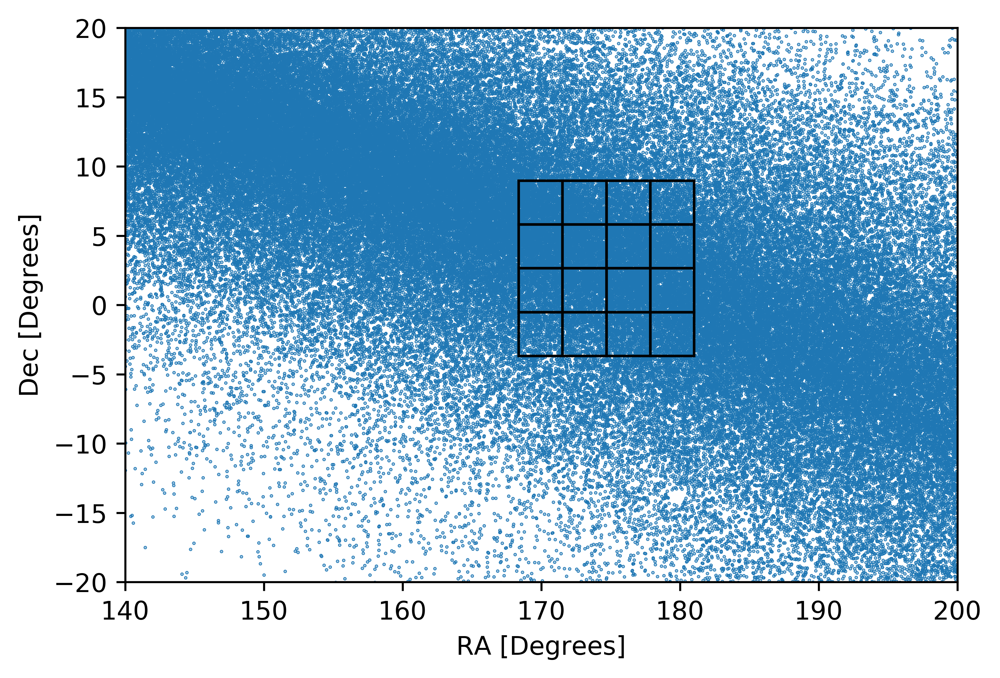

In [13]:
# Plot footprint
fieldArea = 10
xField = np.sqrt(fieldArea)
yField = np.sqrt(fieldArea)

fig, ax = plt.subplots(1, 1, dpi=600)
ax.set_xlabel("RA [Degrees]", fontsize=10)
ax.set_ylabel("Dec [Degrees]", fontsize=10)
fields = [405, 406, 407, 408, 433, 434, 435, 436, 445, 446, 447, 448, 473, 474, 475, 476]
for xx, yy in zip(survey[(survey["night"] == survey["night"].min()) & (survey["fieldId"].isin(fields))]["fieldRA_deg"].values, 
                  survey[(survey["night"] == survey["night"].min()) & (survey["fieldId"].isin(fields))]["fieldDec_deg"].values):
    ax.add_patch(patches.Rectangle((xx-xField/2, yy-yField/2), xField, yField, fill=False, lw=1))
ax.scatter(observations[(observations["night"] == survey["night"].min()) & (observations["designation"] != "NS")]["RA_deg"].values, 
           observations[(observations["night"] == survey["night"].min()) & (observations["designation"] != "NS")]["Dec_deg"].values,
           s=0.1)
ax.set_aspect("equal")
ax.set_ylim(-20, 20)
ax.set_xlim(140, 200)
fig.savefig("../poster/survey_4x4.png")

## Make Reduced Survey

In [14]:
fields = [405, 406, 407, 408, 433, 434, 435, 436, 445, 446, 447, 448, 473, 474, 475, 476]
observations = observations[observations["fieldId"].isin(fields)]

In [15]:
orbits = orbits[orbits["designation"].isin(observations["designation"].unique())]
orbits.drop_duplicates(subset="designation", inplace=True)

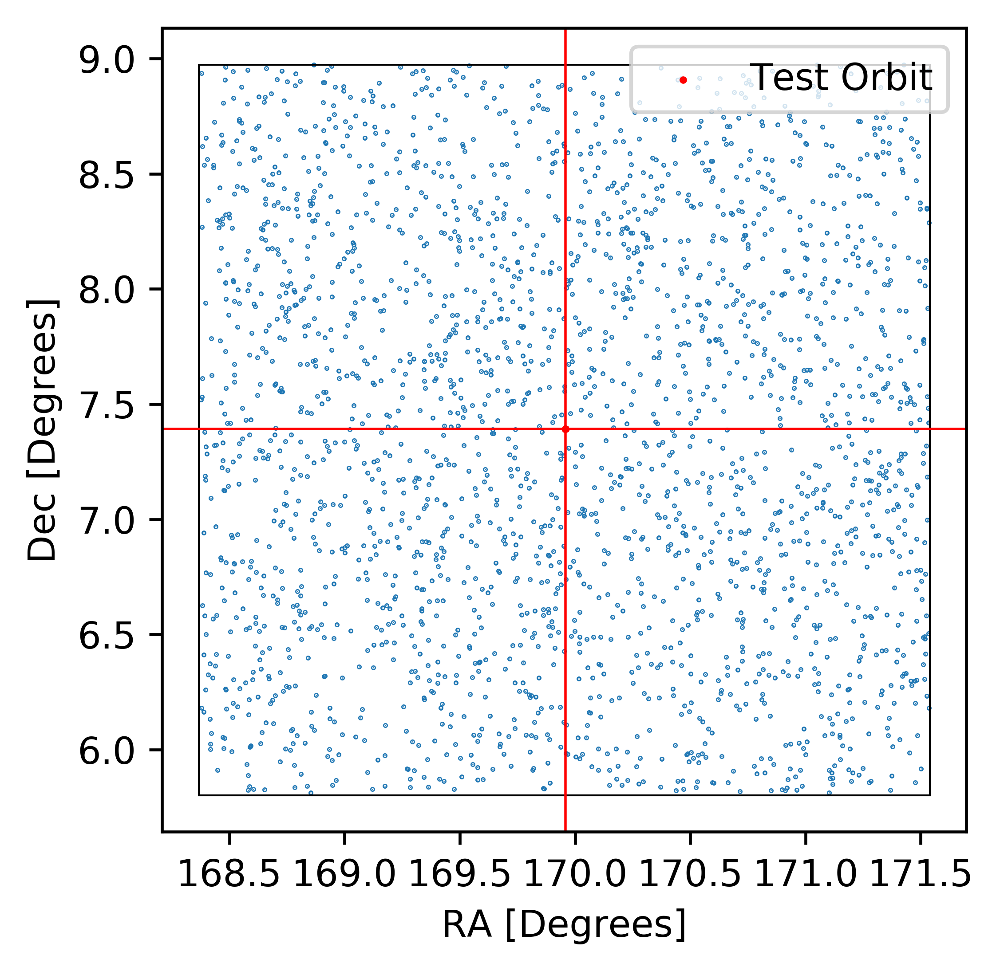

In [71]:
# Plot footprint
fieldArea = 10
xField = np.sqrt(fieldArea)
yField = np.sqrt(fieldArea)

fig, ax = plt.subplots(1, 1, dpi=600)
ax.set_xlabel("RA [Degrees]")
ax.set_ylabel("Dec [Degrees]")
for xx, yy in zip(survey[(survey["night"] == survey["night"].min()) & (survey["fieldId"].isin([405]))]["fieldRA_deg"].values, 
                  survey[(survey["night"] == survey["night"].min()) & (survey["fieldId"].isin([405]))]["fieldDec_deg"].values):
    ax.add_patch(patches.Rectangle((xx-xField/2- 0.01, yy-yField/2 -0.01), xField+0.01, yField+0.01, fill=False, lw=0.5))
ax.scatter(observations[(observations["night"] == survey["night"].min()) & (observations["fieldId"].isin([405]))]["RA_deg"].values, 
           observations[(observations["night"] == survey["night"].min()) & (observations["fieldId"].isin([405]))]["Dec_deg"].values,
           s=0.1)
ax.scatter(survey[survey["fieldId"].isin([405])]["fieldRA_deg"].values, survey[survey["fieldId"].isin([405])]["fieldDec_deg"].values, s=1, c="r", 
           label="Test Orbit")
ax.legend()
ax.set_aspect("equal")
xlim = ax.get_xlim()
ylim = ax.get_ylim()
ax.hlines(survey[survey["fieldId"].isin([405])]["fieldDec_deg"].values, *xlim, lw=0.5, color="r")
ax.vlines(survey[survey["fieldId"].isin([405])]["fieldRA_deg"].values, *ylim, lw=0.5, color="r")
ax.set_xlim(xlim)
ax.set_ylim(ylim)
fig.savefig("../poster/single_exposure.png")

In [73]:
from thor.plotting import _plotGrid

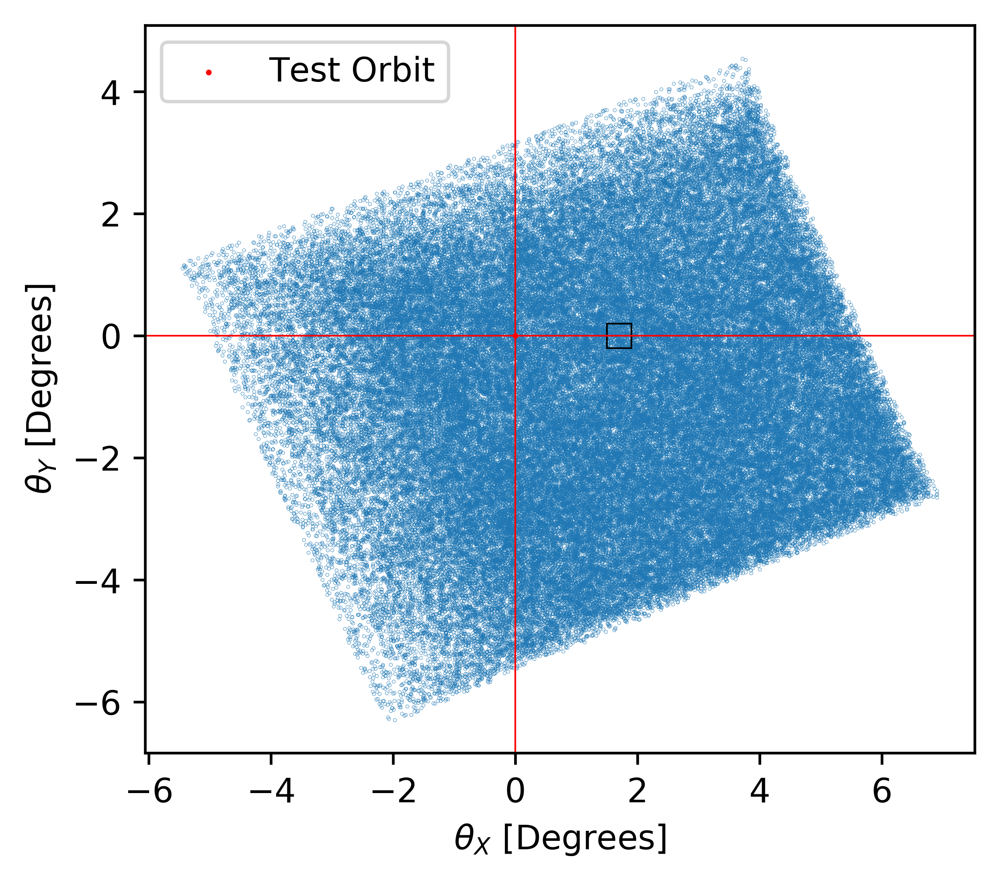

In [78]:
fig, ax = plt.subplots(1, 1, dpi=600)
ax.scatter(projected_obs["theta_x_deg"], projected_obs["theta_y_deg"], s=0.01, label=None)
ax.set_aspect("equal")
xlim = ax.get_xlim()
ylim = ax.get_ylim()
ax.hlines(0, *xlim, lw=0.5, color="r")
ax.vlines(0, *ylim, lw=0.5, color="r")
ax.scatter([0], [0], c="r", s=0.5, label="Test Orbit")
ax.set_xlabel(r"$\theta_X$ [Degrees]")
ax.set_ylabel(r"$\theta_Y$ [Degrees]")
ax.set_xlim(xlim)
ax.set_ylim(ylim)
rect = patches.Rectangle((1.5, -0.2),
                          0.4,
                          0.4, 
                          linewidth=0.5,
                          edgecolor='black',
                          facecolor='none')
ax.add_patch(rect)
ax.legend()

fig.savefig("../poster/projection.png")

## Analyze Observations

In [66]:
allObjects_survey, summary_survey = analyzeObservations(observations)

THOR: analyzeObservations
-------------------------
Analyzing observations...
Object observations: 160724
Noise observations: 127468
Observation contamination (%): 44.230235398623144
Unique objects: 25628
Unique objects with at least 5 detections: 19234

Total time in seconds: 0.34436678886413574
-------------------------



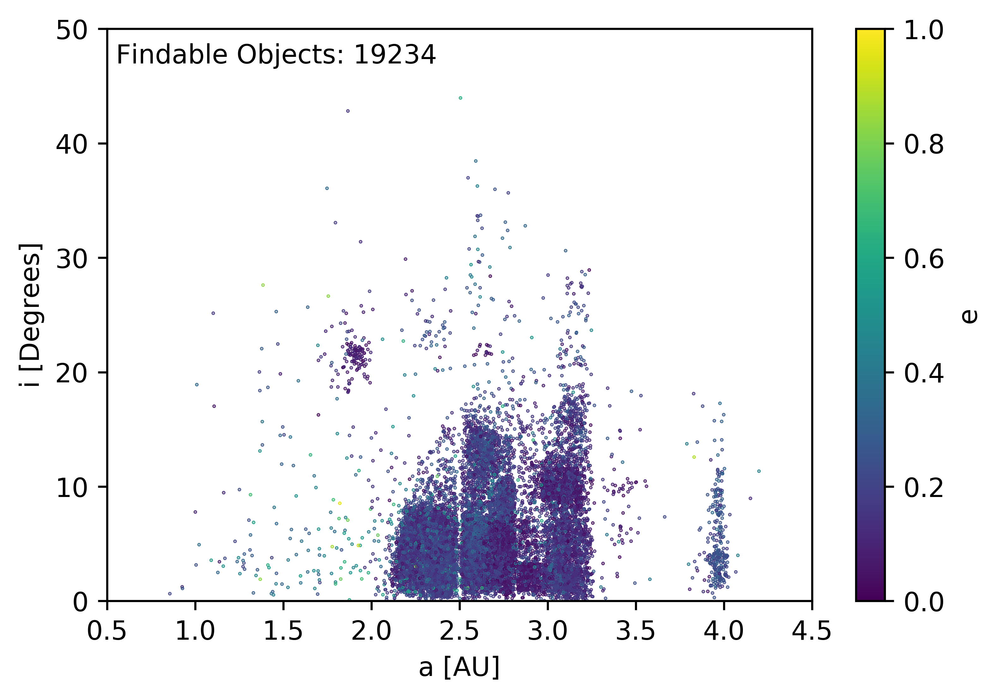

In [88]:
fig, ax = plotOrbitsFindable(allObjects_survey, orbits)
ax.set_xlim(0.5, 4.5)
ax.set_ylim(0, 50)
ax.text(0.55, 47, "Findable Objects: {}".format(len(allObjects_survey[allObjects_survey["findable"] == 1])), size=10)
fig.savefig("../analysis/msst405_4x4/findable_orbits.png")

## Range and Shift

In [34]:
findAverageObject(observations[(observations["visitId"] == 434) & (observations["r_au"] <= 2.1)])

THOR: findAverageObject
-------------------------
L5018 is the most average object.
-------------------------



'L5018'

In [23]:
from thor import Config

In [44]:
average = observations[(observations["visitId"] == 434) & (observations["r_au"] <= 2.3) & (observations["designation"] == "L5018")]

In [38]:
projected_obs = runRangeAndShiftOnVisit(observations, 
                        434, 
                        2.0561456707,
                        np.array([ 0.00563503, -0.0108898 , -0.00035186]),
                        useAverageObject=False,
                        searchArea=10,
                        cellArea=100,
                        verbose=False,
                        )

In [39]:
allObjects_projection, summary_projection = analyzeProjections(projected_obs)

THOR: analyzeProjections
-------------------------
Analyzing projections...
Object observations: 85925
Noise observations: 64918
Observation contamination (%): 43.03679985150123
Unique objects: 13076
Unique objects with at least 5 detections: 10880

Total time in seconds: 362.91800117492676
-------------------------



In [82]:
projected_obs = pd.read_csv("../analysis/msst405_4x4_epyc/visit_405/projected_obs_clustering.txt", sep=" ", index_col=False)

In [ ]:
plotProjections(projected_obs)

In [41]:
projected_obs.to_csv("../analysis/msst405_4x4/visit_434_circular/projected_obs.txt", sep=" ", index=False)

In [42]:
allObjects_projection.to_csv("../analysis/msst405_4x4/visit_434_circular/allObjects_projections.txt", sep=" ", index=False)

In [45]:
average.to_csv("../analysis/msst405_4x4/visit_434_circular/average_obj.txt", sep=" ", index=False)

In [48]:
summary_projection.to_csv("../analysis/msst405_4x4/visit_434_circular/summary_projection.txt", sep=" ", index=False)

(<Figure size 3600x2400 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1b05f37a90>)

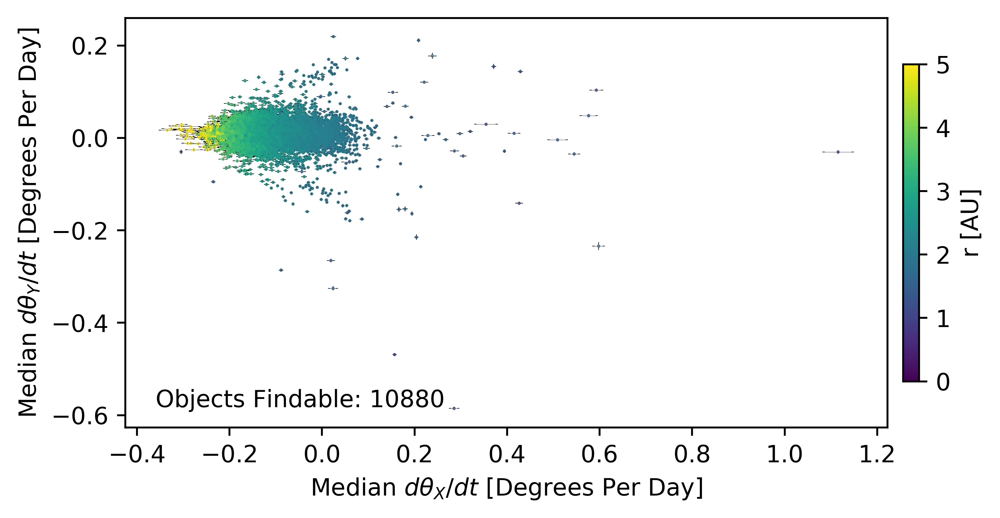

In [40]:
plotProjectionVelocitiesFindable(allObjects_projection)

In [51]:
for visit in fields:
    os.mkdir("../analysis/msst405_4x4/visit_{}".format(visit))
    projected_obs, average = runRangeAndShiftOnVisit(observations, 
                             visit, 
                             2.3,
                             None,
                             useAverageObject=True,
                             searchArea=10,
                             cellArea=100,
                             verbose=False,
                             saveFiles=["../analysis/msst405_4x4/visit_{}/projected_obs_c.txt".format(visit),
                                        "../analysis/msst405_4x4/visit_{}/average_obj_c.txt".format(visit)])

THOR: findAverageObject
-------------------------
c3020 is the most average object.
-------------------------

THOR: findAverageObject
-------------------------
K08Y95U is the most average object.
-------------------------

THOR: findAverageObject
-------------------------
V2276 is the most average object.
-------------------------

THOR: findAverageObject
-------------------------
A9558 is the most average object.
-------------------------

THOR: findAverageObject
-------------------------
G3776 is the most average object.
-------------------------

THOR: findAverageObject
-------------------------
A1076 is the most average object.
-------------------------

THOR: findAverageObject
-------------------------
K13Q27Z is the most average object.
-------------------------

THOR: findAverageObject
-------------------------
d5428 is the most average object.
-------------------------

THOR: findAverageObject
-------------------------
U2749 is the most average object.
------------------------

In [24]:
allObjects_visit = analyzeVisit(observations, 405)

THOR: analyzeVisit
-------------------------
Analyzing visit 405...
Object observations in visit: 1443
Noise observations in visit: 970
Observation contamination (%): 40.198922503108165
Unique objects in visit: 1443
Unique objects with at least 5 detections in survey: 1443

Total time in seconds: 0.10532832145690918
-------------------------



### Analyze Projections

In [25]:
allObjects_projection, summary_projection = analyzeProjections(projected_obs)

THOR: analyzeProjections
-------------------------
Analyzing projections...
Object observations: 69618
Noise observations: 45709
Observation contamination (%): 39.634257372514675
Unique objects: 12107
Unique objects with at least 5 detections: 8077

Total time in seconds: 277.3862018585205
-------------------------



In [27]:
vxRange=[-0.1, 0.1]
vyRange=[-0.1, 0.1]

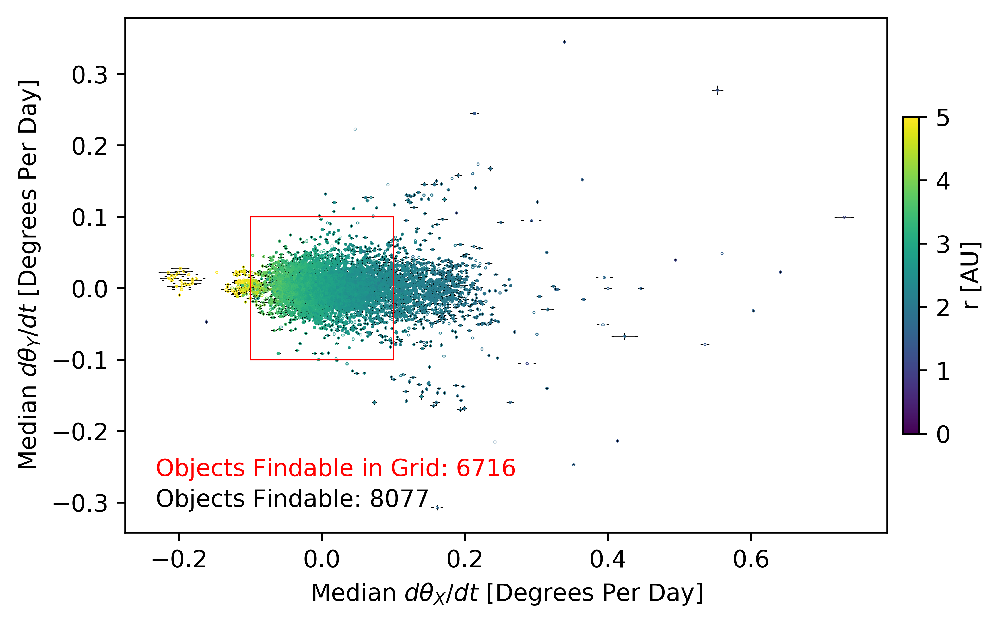

In [28]:
fig, ax = plotProjectionVelocitiesFindable(allObjects_projection, vxRange=vxRange, vyRange=vyRange)

In [34]:
allObjects_projection["found_pure"] = np.NaN * np.ones(len(allObjects_projection))
allObjects_projection["found_partial"] = np.NaN * np.ones(len(allObjects_projection))
allObjects_projection["found"] = np.NaN * np.ones(len(allObjects_projection))

In [37]:
allClusters_projection, clusterMembers_projection = clusterAndLink(
        projected_obs, 
        eps=0.005,
        minSamples=5, 
        vxRange=vxRange, 
        vyRange=vyRange,
        vxBins=20,
        vyBins=20,
        threads=6)

THOR: clusterAndLink
-------------------------
Running velocity space clustering...
X velocity range: [-0.1, 0.1]
X velocity bins: 20
Y velocity range: [-0.1, 0.1]
Y velocity bins: 20
User defined x velocity values: False
User defined y velocity values: False
Velocity grid size: 400
Max sample distance: 0.005
Minimum samples: 5
Using 6 threads...
Done. Completed in 61.25890612602234 seconds.

Restructuring clusters...
Done. Completed in 0.03400588035583496 seconds.

Found 1136 clusters.
Total time in seconds: 61.293251037597656
-------------------------



In [38]:
allClusters_projection, clusterMembers_projection, allObjects_projection, summary_projection = analyzeClusters(
        projected_obs,
        allClusters_projection, 
        clusterMembers_projection, 
        allObjects_projection,
        summary_projection,
        contaminationThreshold=0.2,
        minSamples=5)

THOR: analyzeClusters
-------------------------
Analyzing clusters...
Pure clusters: 242
Partial clusters: 85
Duplicate visit clusters: 718
False clusters: 809
Total clusters: 1136
Cluster contamination (%): 71.21478873239437
Unique linked objects: 327
Unique missed objects: 7750
Completeness (%): 4.048532871115513
Done.
Total time in seconds: 0.35199713706970215
-------------------------



In [82]:
def grabLinkedDetections(observations, allClusters, clusterMembers, columnMapping=Config.columnMapping):
    """
    Grabs linked observations from pure and partial clusters.
    
    Parameters
    ----------
    observations : 
    
    
    """
    
    
    pure_clusters = allClusters[allClusters["pure"] == 1]["cluster_id"].values
    pure_obs_ids_linked = clusterMembers[clusterMembers["cluster_id"].isin(pure_clusters)]["obs_id"].values

    partial_clusters = allClusters[allClusters["partial"] == 1]["cluster_id"].values
    cluster_designation = clusterMembers[clusterMembers["cluster_id"].isin(partial_clusters)].merge(observations[["obs_d", "designation"]], 
                                                                                                    left_on="obs_id", 
                                                                                                    right_on="obsId")
    cluster_designation = cluster_designation.merge(allClusters[["cluster_id", "linked_object"]])
    partial_obs_ids_linked = cluster_designation[cluster_designation["designation"] == cluster_designation["linked_object"]]["obs_id"].values
    
    linked_obs_ids = np.concatenate([pure_obs_ids_linked, partial_obs_ids_linked])
    return np.unique(linked_obs_ids)

In [97]:
def runClusterAndLinkOnVisit(observations, 
                             visitId,
                             vxRange=[-0.1, 0.1], 
                             vyRange=[-0.1, 0.1],
                             vxBins=100, 
                             vyBins=100,
                             vxValues=None,
                             vyValues=None,
                             threads=6, 
                             eps=0.005, 
                             minSamples=5,
                             contaminationThreshold=0.2, 
                             saveDir=None,
                             verbose=True,
                             columnMapping=Config.columnMapping):
    """
    Parameters
    ----------
    observations : `~pandas.DataFrame`
        DataFrame containing post-range and shift observations.
    visitId : int
        Visit ID. 
    orbits : `~pandas.DataFrame`
        Orbit catalog.
    avgObject : `~pandas.DataFrame`
        A slice into the observations dataframe
        with the object's corresponding observation.
    vxRange : {None, list or `~numpy.ndarray` (2)}
        Maximum and minimum velocity range in x. 
        Will not be used if vxValues are specified. 
        [Default = [-0.1, 0.1]]
    vxRange : {None, list or `~numpy.ndarray` (2)}
        Maximum and minimum velocity range in y. 
        Will not be used if vyValues are specified. 
        [Default = [-0.1, 0.1]]
    vxBins : int, optional
        Length of x-velocity grid between vxRange[0] 
        and vxRange[-1]. Will not be used if vxValues are 
        specified. 
        [Default = 100]
    vyBins: int, optional
        Length of y-velocity grid between vyRange[0] 
        and vyRange[-1]. Will not be used if vyValues are 
        specified. 
        [Default = 100]
    vxValues : {None, `~numpy.ndarray`}, optional
        Values of velocities in x at which to cluster
        and link. 
        [Default = None]
    vyValues : {None, `~numpy.ndarray`}, optional
        Values of velocities in y at which to cluster
        and link. 
        [Default = None]
    threads : int, optional
        Number of threads to use. 
        [Default = 12]
    eps : float, optional
        The maximum distance between two samples for them to be considered 
        as in the same neighborhood. 
        See: http://scikit-learn.org/stable/modules/generated/sklearn.cluster.dbscan.html
        [Default = 0.005]
    minSamples : int, optional
        The number of samples (or total weight) in a neighborhood for a 
        point to be considered as a core point. This includes the point itself.
        See: http://scikit-learn.org/stable/modules/generated/sklearn.cluster.dbscan.html
        [Default = 5]
    partialThreshold : float, optional
        Percentage (expressed between 0 and 1) of observations in a cluster required for the 
        object to be found. 
        [Default = 0.8]
    saveDir : {None, str}, optional
        Directory where to save outputs inluding plots. Will create
        a sub-directory inside directory. 
        [Default = None]
    verbose : bool, optional
        Print progress statements? 
        [Default = True]
    columnMapping : dict, optional
        Column name mapping of observations to internally used column names. 
        [Default = `~thor.Config.columnMapping`]
    
    """
    avg_obj = avgObject[columnMapping["name"]].values[0]
    o = orbits[orbits[columnMapping["name"]] == avg_obj]
    
    if saveDir is not None:
        baseName = os.path.join(saveDir, "visitId{}_{}".format(visitId, avg_obj))
        os.makedirs(baseName)
        saveFiles1=[os.path.join(baseName, "allClusters_pre.txt"),
                   os.path.join(baseName, "clusterMembers_pre.txt")]
        saveFiles2=[os.path.join(baseName, "allClusters_post.txt"),
                   os.path.join(baseName, "clusterMembers_post.txt"),
                   os.path.join(baseName, "allObjects.txt"),
                   os.path.join(baseName, "summary.txt")]
    else:
        saveFiles1 = None
        saveFiles2 = None
    
    allClusters, clusterMembers = clusterAndLink(
        observations, 
        eps=eps, 
        minSamples=minSamples, 
        vxRange=vxRange, 
        vyRange=vyRange, 
        vxBins=vxBins, 
        vyBins=vyBins, 
        saveFiles=saveFiles1,
        vxValues=vxValues,
        vyValues=vyValues,
        threads=threads,
        verbose=verbose,
        columnMapping=columnMapping)
    
    allClusters, clusterMember, allObjects, summary = analyzeClusters(
        observations, 
        allClusters, 
        clusterMembers, 
        contaminationThreshold=contaminationThreshold, 
        minSamples=minSamples,
        saveFiles=saveFiles2,
        verbose=verbose,
        columnMapping=columnMapping)
    
        
    return
